# Tutorial - Creating a map and KDE plot of points and polygons with Python

In [1]:
import numpy as np 
import pandas as pd
import geopandas as gpd 
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from matplotlib.path import Path
from matplotlib.textpath import TextToPath
import tilemapbase
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

import seaborn as sns
import shapely.speedups
shapely.speedups.enable()

C:\Users\Work\.virtualenvs\map_creation_amsterdam_python-ns_JS8rc\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
C:\Users\Work\.virtualenvs\map_creation_amsterdam_python-ns_JS8rc\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
C:\Users\Work\.virtualenvs\map_creation_amsterdam_python-ns_JS8rc\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
C:\Users\Work\.virtualenvs\map_creation_amsterdam_python-ns_JS8rc\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authori

Download the following data and save extract it into the ./data folder of this project:

- http://download.geofabrik.de/europe/netherlands/noord-holland-latest-free.shp.zip

- https://maps.amsterdam.nl/open_geodata/geojson.php?KAARTLAAG=GEBIED_STADSDELEN&THEMA=gebiedsindeling

## Loading and preprocessing the data

Load the POI data:

In [2]:
points = gpd.read_file("./data/gis_osm_pois_free_1.shp")

In [3]:
points = points.to_crs({"init": "EPSG:3857"})

C:\Users\Work\.virtualenvs\map_creation_amsterdam_python-ns_JS8rc\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


filter the data for restaurants (or any other POI category)

In [4]:
points = points[points["fclass"] == "restaurant"]

take a quick look into the data

In [5]:
points

,osm_id,code,fclass,name,geometry
92,30839687,2301,restaurant,de Eethoek,POINT (521775.259 6910003.671)
144,34043796,2301,restaurant,Sizzling Wok,POINT (550760.350 6853264.008)
146,34044093,2301,restaurant,De Roode Leeuw,POINT (544752.526 6867988.375)
309,94829656,2301,restaurant,Pata Negra,POINT (548267.528 6865590.954)
314,95288389,2301,restaurant,Meram,POINT (548310.876 6864750.556)
...,...,...,...,...,...
36941,7124541137,2301,restaurant,Bregje,POINT (505775.464 6873030.827)
37028,7125482608,2301,restaurant,Bregje,POINT (574849.387 6850115.479)
37099,7126562153,2301,restaurant,Antiek China,POINT (522483.151 6928160.974)
37100,7126562155,2301,restaurant,Duinberk,POINT (522497.422 6928134.759)


load the shapefile for the city of amsterdam

In [6]:
city = gpd.read_file("./data/geojson.json")

In [7]:
city = city.to_crs({"init": "EPSG:3857"})

C:\Users\Work\.virtualenvs\map_creation_amsterdam_python-ns_JS8rc\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


take a quick look into this data as well

In [8]:
city

,Stadsdeel_code,Stadsdeel,Opp_m2,geometry
0,A,Centrum,8043500,"POLYGON ((549136.599 6867376.523, 549133.148 6..."
1,B,Westpoort,28991600,"POLYGON ((543892.115 6872660.218, 543540.457 6..."
2,E,West,10629900,"POLYGON ((544918.815 6870710.847, 544873.285 6..."
3,F,Nieuw-West,38015500,"POLYGON ((539955.524 6866252.019, 539951.183 6..."
4,K,Zuid,17274000,"POLYGON ((547134.629 6862225.476, 547129.731 6..."
5,M,Oost,30594900,"POLYGON ((560946.039 6864490.649, 560918.543 6..."
6,N,Noord,63828800,"POLYGON ((565410.507 6870704.099, 564865.041 6..."
7,T,Zuidoost,22113700,"POLYGON ((558996.500 6854997.221, 558987.372 6..."


perform a spatial join between the points and polygons and filter out any points that did not match with the polygons

In [9]:
points = gpd.sjoin(points, city, how="left")
points = points.dropna(subset=["index_right"])

plot both data sets to see if the spatial join was performed correctly

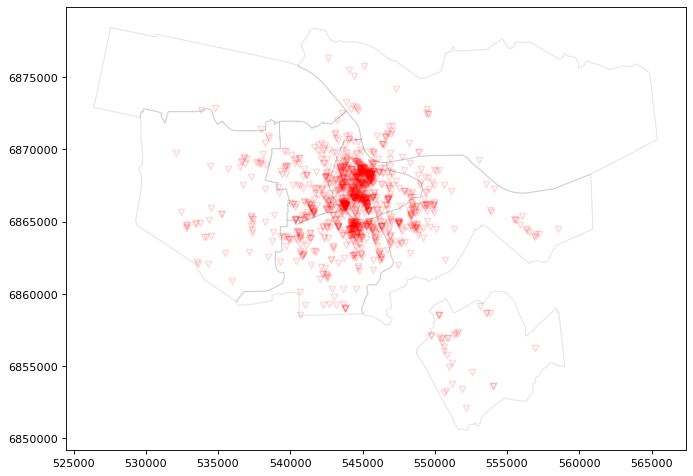

In [10]:
# edit the figure size however you need to
plt.figure(num=None, figsize=(10,10), dpi=80, facecolor='w', edgecolor='k')
# create plot and axes
fig = plt.plot()
ax1 = plt.axes()
# these values can be changed as needed, the markers are LaTeX symbols
city.plot(ax=ax1, alpha=0.1, edgecolor="black", facecolor="white")
points.plot(ax=ax1, alpha = 0.1, color="red", marker='$\\bigtriangledown$',)
ax1.figure.savefig('./data/plot1.png', bbox_inches='tight')

## Add a background map to the plot

to get a nice background map, we need to find out all the boundaries of our data and save that for later plotting

In [11]:
bounding_box = [points["geometry"].x.min(), points["geometry"].x.max(), points["geometry"].y.min(), points["geometry"].y.max()]

load the background map using `tilemapbase`

In [12]:
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(city, buffer = 25)

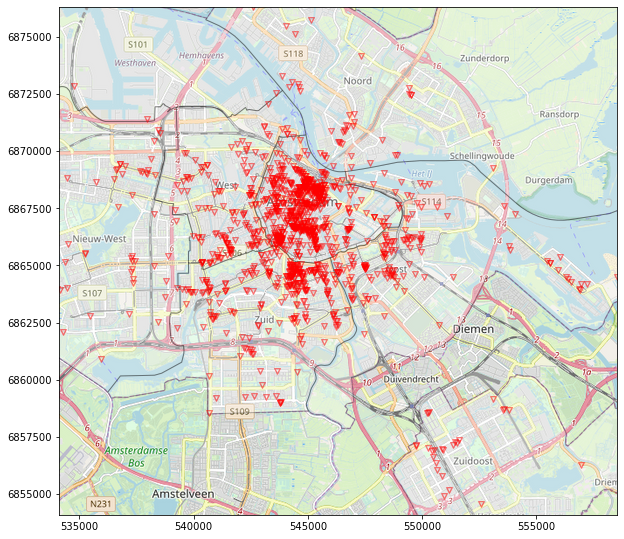

In [28]:

fig, ax = plt.subplots(figsize=(10,10))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
ax.set_xlim(bounding_box[0]+2000, bounding_box[1])
ax.set_ylim(bounding_box[2]+2000, bounding_box[3])
city.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
points.plot(ax=ax, alpha = 0.4, color="red", marker='$\\bigtriangledown$',)
ax.figure.savefig('./data/plot1.png', bbox_inches='tight')


## Create a function to shorten the amount of code needed

In [37]:
def plot_map(fig, ax, points_plot, polygons_plot, file_name):
    
    plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
    plotter.plot(ax)
    ax.set_xlim(bounding_box[0]+2000, bounding_box[1])
    ax.set_ylim(bounding_box[2]+2000, bounding_box[3])
    polygons_plot
    points_plot
    ax.figure.savefig(f'./data/{file_name}.png', bbox_inches='tight')

figure and axis have to be created new every time

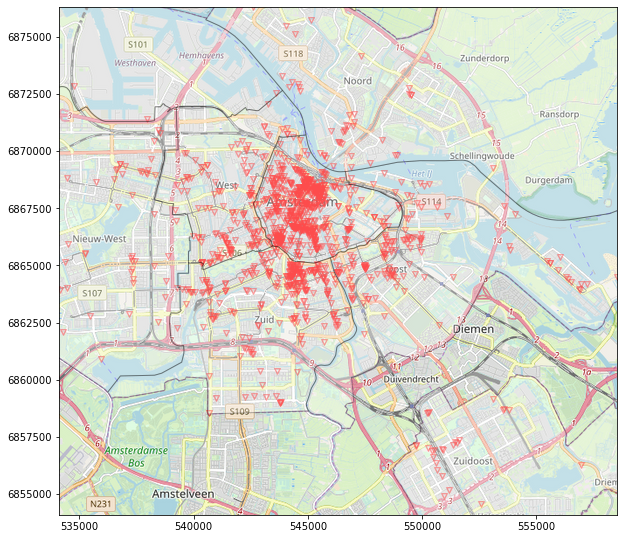

In [39]:
fig, ax = plt.subplots(figsize=(10,10))
plot_map(fig, ax, points.plot(ax=ax, alpha = 0.4, color="red", marker='$\\bigtriangledown$',), city.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white"), "plot1")


## Show a KDE plot of the spatial distribution

To get an impression on the spatial distribution, a KDE plot might help. For this we use the `kdeplot`-function from seaborn.

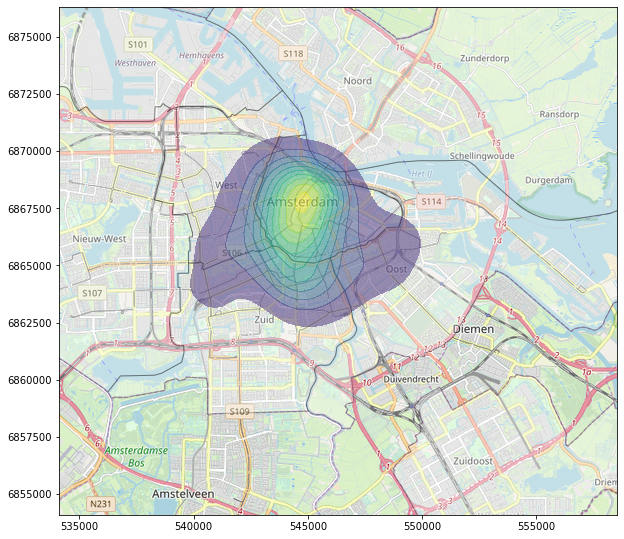

In [19]:

fig, ax = plt.subplots(figsize=(10,10))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
ax.set_xlim(bounding_box[0]+2000, bounding_box[1])
ax.set_ylim(bounding_box[2]+2000, bounding_box[3])
city.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
sns.kdeplot(points["geometry"].x, points["geometry"].y, shade=True, alpha=0.5, cmap="viridis", shade_lowest=False)
ax.figure.savefig('./data/plot2.png', bbox_inches='tight')


## Color the markers with the KDE information

instead of drawing the KDE as a single shape, we can also color our points according to the density. For this we calculate the gaussian KDE separately and use the result as z-values for our plot. The markers can be changed to ones liking, for this case I settled with simple points.

In [15]:
xy = np.vstack([points["geometry"].x,points["geometry"].y])
z = gaussian_kde(xy)(xy)

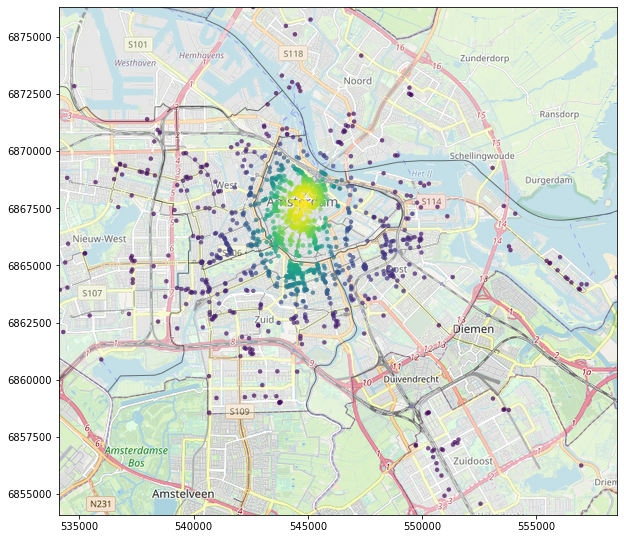

In [16]:
fig, ax = plt.subplots(figsize=(10,10))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
ax.set_xlim(bounding_box[0]+2000, bounding_box[1])
ax.set_ylim(bounding_box[2]+2000, bounding_box[3])
city.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
ax.scatter(points["geometry"].x, points["geometry"].y, c=z, s=20, zorder=2, edgecolor='',  alpha=0.7)
ax.figure.savefig('./data/plot3.png', bbox_inches='tight')


## Use more specific symbols as map markers

If you want to change the markers in the map to more sophisticated ones, you could also use Font Awesome. Download the font from here and save it to `/resources/`. Edit the `symbols` dict to add symbols that might fit your subject, a cheat sheet for the unicode characters can be found on [the fontawesome website](https://fontawesome.com/cheatsheet). Just add a `\u` to any of the unicode characters.

In [17]:
fp = FontProperties(fname=r"./resources/Font Awesome 5 Free-Solid-900.otf") 

def get_marker(symbol):
    v, codes = TextToPath().get_text_path(fp, symbol)
    v = np.array(v)
    mean = np.mean([np.max(v,axis=0), np.min(v, axis=0)], axis=0)
    return Path(v-mean, codes, closed=False)

symbols = dict(map = "\uf041", map_alt = "\uf3c5")

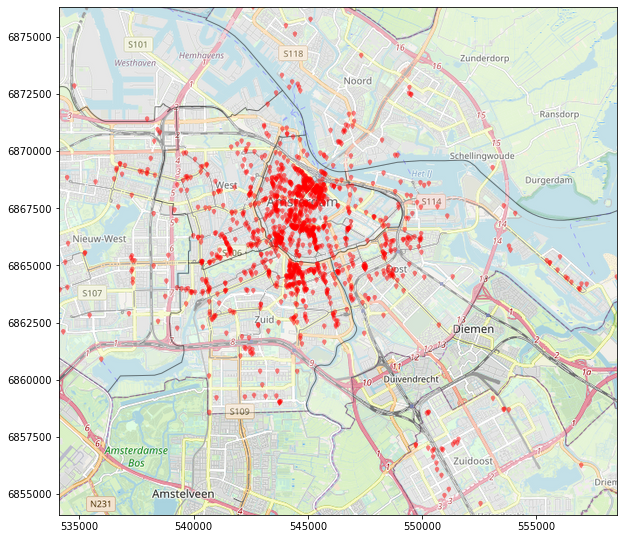

In [18]:


fig, ax = plt.subplots(figsize=(10,10))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)
plotter.plot(ax)
ax.set_xlim(bounding_box[0]+2000, bounding_box[1])
ax.set_ylim(bounding_box[2]+2000, bounding_box[3])
city.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
ax.scatter(points["geometry"].x, points["geometry"].y, c="red", s=35, zorder=2, edgecolor='',  alpha=0.5, marker=get_marker(symbols["map"]))
ax.figure.savefig('./data/plot4.png', bbox_inches='tight')


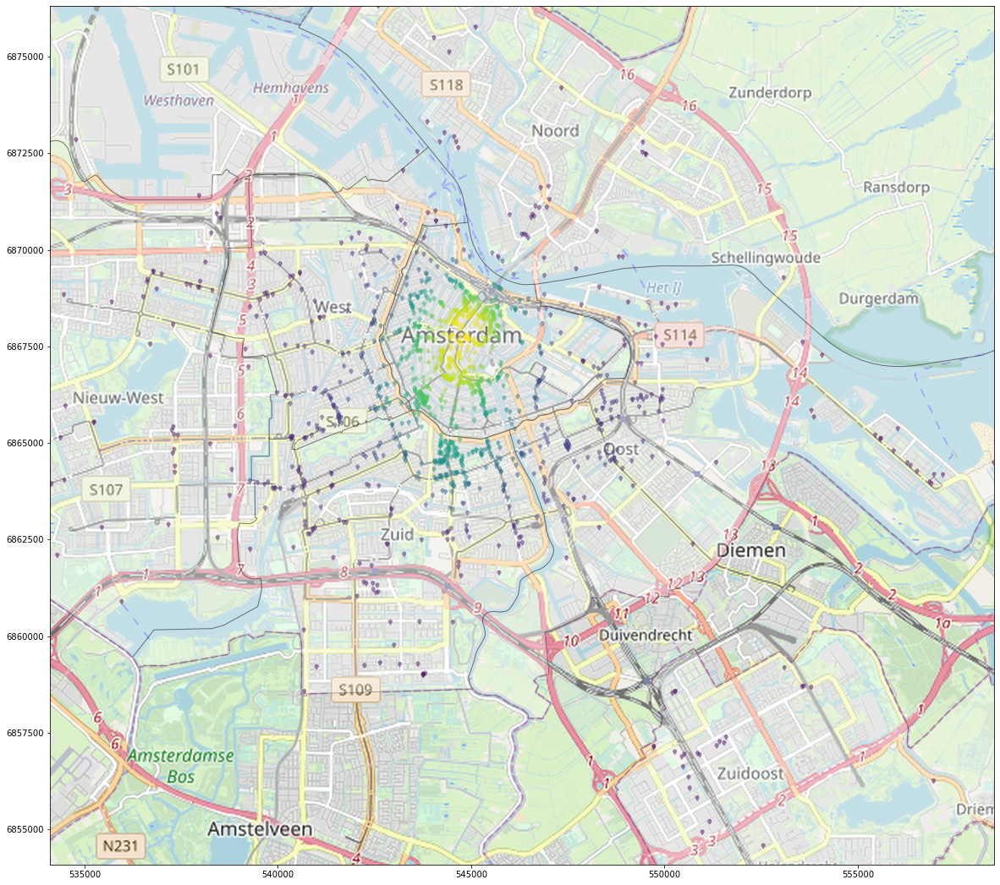

In [21]:
fig, ax = plt.subplots(figsize=(20,20))

plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1500)
plotter.plot(ax)
ax.set_xlim(bounding_box[0]+2000, bounding_box[1])
ax.set_ylim(bounding_box[2]+2000, bounding_box[3])
city.plot(ax=ax, alpha=0.3, edgecolor="black", facecolor="white")
ax.scatter(points["geometry"].x, points["geometry"].y, c=z, s=45, zorder=2, edgecolor='',  alpha=0.5, marker=get_marker(symbols["map"]))
ax.figure.savefig('./data/plot5.png', bbox_inches='tight')
